# FINAL PROJECT : Finding Your Ideal Wine

## By Camden Masters and Shreelekha Revankar

Walking into the liquor store, the wine section can be a daunting experience. There are hundreds of varieties of wines and the prices range from a few dollars to a few thousands. Ten minutes of awkwardly reading the bottles and prices and you are out! You've spent 50 dollars and it all the wine you got tastes like crap!

How would you like to better that experience? What if there was a way to make purchasing wine easier and more efficient?

In our tutorial we hope to find the best wine for different budgets, and to find similar wines to ones you may already enjoy.That way no matter how large or how little your budget is, you know you're getting the best wine your money can buy.Not only saving us money but also giving our pallets something to enjoy. 

This dataset consists of 130 thousand listings of wines. The prices range from 4 dollars to 3300 dollars per bottle. The wines are rated by connosieurs and span many countries world wide. More information can be found at https://www.kaggle.com/zynicide/wine-reviews?select=winemag-data_first150k.csv

Motivation: We believe that this is a good example of how data science can be applied to optimize everyday tasks.The tools shown in this tutorial can also be applied to topics and things beyond wine. Together the first and second section of our tutorial allow online retailers and subscription-based retail services to find what the user would like the most as well as suggest to the user what other things they might enjoy.

This tutorial is broken down into two parts. The first section handles finding the most similar wine to any given wine based on variety, points, and price.handles finding the best wine for a specific price range for the variety of wine of your choosing. The second section handles finding the best wine for a specific price range for the variety of wine of your choosing.



In [47]:
import pandas as pd
import matplotlib.pylab as plt
import matplotlib.axes as ax
import seaborn as sns
import numpy as np

In [48]:
wine_table = pd.read_csv('/winemag-data_first150k.csv')
#Provide the ability to show the entirety of the data when not looking at the head
pd.set_option("max_columns", None)
pd.set_option("max_rows", None)
wine_table.head()

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude


# Section 1: Finding the most similar wine given any wine



## Creating numerical points for non-numerical data

Our aim is to use the Euclidean Distance formula to find a wine "closest" to our search wine. Here closest does not mean physically in our list, but rather on similarity of three factors: Price, Points and Variety.

You may be familiar with a simple distance formula for 2 dimensions, however we have here a third dimension: Variety.
Variety is not a numerical data source. How does one analyse it as such?

We can do so by assigning a unique numeric value for every variety, thus allowing us to treat it as a number

In [54]:
# Finding unique varieties of wine in data 

print('Variety:')

varieties = list(set(wine_table['variety'].to_list()))
wine_table['variety'].sort_values().unique()


# Displaying a sample of varieties
print(varieties[0:50])


Variety:
['Valdiguié', 'Chardonnay-Albariño', 'Yapincak', 'Malbec', 'Rhône-style Red Blend', 'Mazuelo', 'Alicante Bouschet', 'Kekfrankos', 'Tinta Negra Mole', 'Muscat', 'Shiraz-Cabernet Sauvignon', 'Plavac Mali', 'Pinot Blanc-Chardonnay', 'Freisa', 'Sarba', 'Vitovska', 'Merlot-Grenache', 'Malbec-Bonarda', 'Portuguese Rosé', 'Sangiovese', 'Sauvignon Blanc-Semillon', 'Siria', 'Irsai Oliver', 'Mavrud', 'Gamay', 'Muscatel', 'Aleatico', 'Roscetto', 'Duras', 'Lambrusco di Sorbara', 'Terret Blanc', 'Rosé', 'Riesling', 'Malagouzia', 'Mencía', 'Verduzzo', 'Morio Muskat', 'Jaen', 'Syrah-Petite Sirah', 'Viura-Sauvignon Blanc', 'Hárslevelü', 'Sangiovese-Syrah', 'Tai', 'Romorantin', 'Refosco', 'País', 'Merlot', 'Pugnitello', 'Sacy', "Muscat d'Alexandrie"]


In [55]:
# We will be using the index number from this set to act as the unique number identifier for each variety

print(varieties.index('Malbec'))

3


## Creating a 3-d point to represent a specific wine

Here in the data frame below, one can see two Malbec wines with very similar points and prices, our goal is to be able to find the most similar wine to our search wine as possible.

First we need to create an (x,y,z) coordinate to represent the (variety,price,points)

In [56]:
# Given a specific wine, we want to be able to predict the wine closest or most similar to the specified wine based on variety, price and score

is_Malbec =  wine_table['variety']=='Malbec'
malbec_table = wine_table[is_Malbec]

# Checking to see that filter worked
print('Malbec:')
print(malbec_table['variety'].sort_values().unique())
malbec_table.head()


Malbec:
['Malbec']


,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery,custom_price_range
18,18,France,Coming from a seven-acre vineyard named after ...,Le Pigeonnier,95,290.0,Southwest France,Cahors,NaN,Malbec,Château Lagrézette,>500
60,60,Argentina,"Concentrated, ripe blackberry and cassis aroma...",The Apple Doesn't Fall Far From The Tree,91,30.0,Mendoza Province,Mendoza,NaN,Malbec,Matias Riccitelli,20-50
62,62,Argentina,Smoky aromas of fresh-cut wood blend with berr...,Alegoría Gran Reserva,91,25.0,Mendoza Province,Mendoza,NaN,Malbec,Navarro Correas,20-50
115,115,Argentina,"Aromas of prune, raisin and black plum are ful...",Reserva,86,15.0,Mendoza Province,Valle de Uco,NaN,Malbec,Viñalba,0-20
190,190,Argentina,Dark-berry aromas are crisp and show a note of...,Reserve,87,15.0,Mendoza Province,Tupungato,NaN,Malbec,Tupun,0-20


In [57]:
# Creating points from wine rows to find euclidean distance
# Taking the example of an under 20 dollar bottle of Malbec (This corresponds to row 115 in the data set)
wine = wine_table.loc[115]
print(wine)
print("===================================")
print(wine['variety'])
print(varieties.index(wine['variety']))
print(int(wine['price']))
print(wine['points'])
print("===================================")

variety_id = varieties.index(wine['variety'])

# intializing point for search wine
search  = np.array(((varieties.index(wine['variety'])), (int(wine['price'])), (wine['points']))) 

print("search element:")
print(search)

Unnamed: 0                                                          115
country                                                       Argentina
description           Aromas of prune, raisin and black plum are ful...
designation                                                     Reserva
points                                                               86
price                                                                15
province                                               Mendoza Province
region_1                                                   Valle de Uco
region_2                                                            NaN
variety                                                          Malbec
winery                                                          Viñalba
custom_price_range                                                 0-20
Name: 115, dtype: object
Malbec
3
15
86
search element:
[ 3 15 86]


# Calculating Similarity
Here we use the Euclidean distance between our search wine and any other wine to see which one is the most similar. As you can see, from the two wines below, a wine of the same variety and similar price and points will have a much smaller "distance" from our search wine than that of a wine of different variety, and less similar price and points

A more basic example using simple integers can be found at: https://www.w3resource.com/python-exercises/math/python-math-exercise-79.php

In [58]:
# Calculating Euclidean distance for two random wines

elem1 = wine_table.loc[86]
print("first random wine: ")
print(elem1)
element1 = np.array(((varieties.index(elem1['variety'])), (int(elem1['price'])), (elem1['points'])))
print("")
print("first random wine point: ")
print(element1)
print("====================================================================================")


elem2 = wine_table.loc[190]
print("second random wine: ")
print(elem2)
element2 = np.array(((varieties.index(elem2['variety'])), (int(elem2['price'])), (elem2['points'])))
print("")
print("second random wine point: ")
print(element2)
print("====================================================================================")
print("")

print("search element:")
print(search)
print("====================================================================================")

# printing Euclidean distance 
print("")
print("Difference between first random wine and our wine")
dist1 = np.linalg.norm(search - element1) 
print(dist1)
print("")
print("Difference between second random wine and our wine")
dist2 = np.linalg.norm(search - element2) 
print(dist2)

first random wine: 
Unnamed: 0                                                           86
country                                                          France
description           This delicious, refreshing wine is textured, t...
designation                                       Montmains Premier Cru
points                                                               91
price                                                                45
province                                                       Burgundy
region_1                                                        Chablis
region_2                                                            NaN
variety                                                      Chardonnay
winery                                         Domaine Gérard Duplessis
custom_price_range                                                20-50
Name: 86, dtype: object

first random wine point: 
[391  45  91]
second random wine: 
Unnamed: 0                    

## Finding the most similar wine

Here we see the difference between wines, using this we can find the wine with the smallest difference from our search wine, not including itself.
We can use the list of only malbec just to save ourselves a little time.

In [59]:
# looping through data-frame to find most similar wine and recording the wine with the smallest difference

print("Search Element:")
print("")
print(wine['variety'])
print(varieties.index(wine['variety']))
print(int(wine['price']))
print(wine['points'])
print("")
print(search)
print("")
print("====================================================================================")



print("Total number of Wines:")
print(len(wine_table.index))

print("")
# For the sake of saving calculation time and space I will be running the distance algorithm on a filtered set of wines
# This set is the set of wines of the same variety
print("Total number of Malbec wines:")
print(len(malbec_table.index))


Search Element:

Malbec
3
15
86

[ 3 15 86]

Total number of Wines:
150930

Total number of Malbec wines:
3208


In [60]:


# Here we could have used the entire table but for the sake of the tutorial and calculation time we will use the filered table
def findSimilar():
    min_row = 0
    min_dist = 100.0
    
    for x in malbec_table.dropna().index:
        elem = wine_table.loc[x]
        point = np.array(((varieties.index(elem['variety'])), (int(elem['price'])), (elem['points'])))
        dist = np.linalg.norm(search - point) 
        if dist < min_dist and dist > 0:
            min_dist = dist
            min_row = x
            
    return min_row
##
similar = findSimilar()

print("Wine most similar to our input row is:")
most_sim = wine_table.loc[similar]
print(wine_table.loc[similar])


Wine most similar to our input row is:
Unnamed: 0                                                         8500
country                                                              US
description           The generous fruit flavors in this medium-bodi...
designation                                     The Heritage Collection
points                                                               86
price                                                                14
province                                                     California
region_1                                                           Lodi
region_2                                                 Central Valley
variety                                                          Malbec
winery                                                          Peirano
custom_price_range                                                 0-20
Name: 8500, dtype: object


In [61]:
print("Search Wine:")
print("")
print(wine['variety'])
print(int(wine['price']))
print(wine['points'])
print("")
print(wine)
print("______________________________")
print("Most Similar Wine:")
print("")
print(most_sim['variety'])
print(int(most_sim['price']))
print(most_sim['points'])
print("")
print(most_sim)
print("")

Search Wine:

Malbec
15
86

Unnamed: 0                                                          115
country                                                       Argentina
description           Aromas of prune, raisin and black plum are ful...
designation                                                     Reserva
points                                                               86
price                                                                15
province                                               Mendoza Province
region_1                                                   Valle de Uco
region_2                                                            NaN
variety                                                          Malbec
winery                                                          Viñalba
custom_price_range                                                 0-20
Name: 115, dtype: object
______________________________
Most Similar Wine:

Malbec
14
86

Unnamed: 0        

Here we see our Input wine, a 14 dollar Malbec from Mendoza Province is most similar to another 14 dollar Malbec from Central Valley

# Section 2: Finding the Best Wine based off of Price and Variety

Our goal when beginning to examine data for customers who are new to drinking wine is to find the overall best taste for price.  By finding the best tasting wine at a reasonable price, this may help customers explore their interest in wine while not having to spend too much money.  By gathering data within price ranges and then finding what wine scores the best for its price within those ranges we are able to find what types of wine are the best at certain price ranges.  Our scatter plots shown below each have one graph for our set price ranges that we defined.  These plots can then be broken into four quadrants and based off of the location of the plot, we can draw conclusions about the type of wine at that price range.  Points are plotted based off of average score and price for the type of wine tested.  Varieties in the top left quadrant represent a high score and low price which is the most efficient use of customer’s money.  The top right quadrant shows high score for a high price and can be useful for people who want to explore more expensive wine.  The bottom left quadrant groups types of wine that are bad tasting and low price for this price range.  Finally, the bottom right quadrant is the least desired types of wine because they have a low score and high price which is the least efficient way to spend money when aiming for good tasting wine.


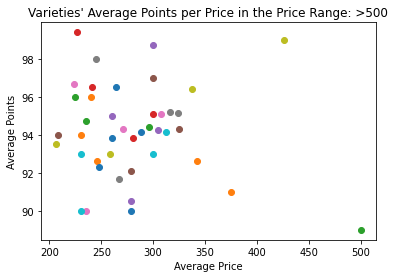

<Figure size 720x576 with 0 Axes>

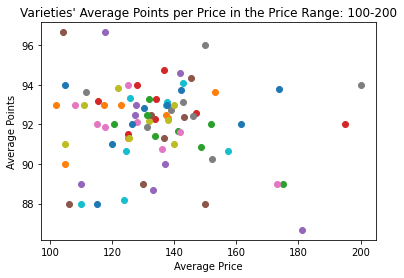

<Figure size 720x576 with 0 Axes>

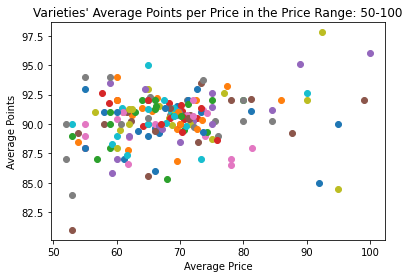

<Figure size 720x576 with 0 Axes>

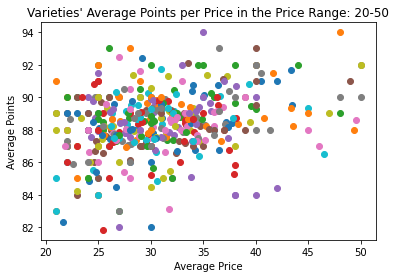

<Figure size 720x576 with 0 Axes>

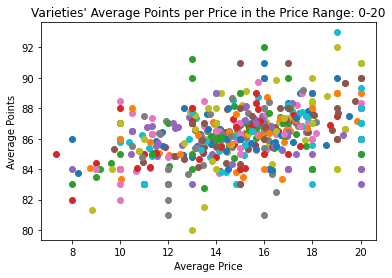

<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

In [52]:
#Create custom cut intervals for easier use by a customer
cut_labels = ['0-20', '20-50', '50-100', '100-200','>500']
cut_bins = [0, 20, 50, 100, 200,500]
wine_table['custom_price_range'] = pd.cut(wine_table['price'].to_list(), bins=cut_bins, labels=cut_labels)

#Lists of intervals and varieties that can be looped without duplicates
intervals = wine_table['custom_price_range']
intervals = list(dict.fromkeys(intervals))
variety = wine_table['variety']
variety = list(dict.fromkeys(variety))

for curr in intervals:
    #Query of a mini data table where all custom price ranges match the curr in the interval loop
    qry = wine_table[wine_table['custom_price_range'] == curr]

    #Loop through varieties within this interval
    varieties = qry['variety']
    varieties = list(dict.fromkeys(varieties))
    for var in varieties:
        #For each variety in this custom price range, gather the price and points
        qry2 = qry[qry['variety'] == var]
        pay = qry2['price'].to_list()
        points = qry2['points'].to_list()
        
        pay_sum = 0
        points_sum = 0
        
        for p in pay:
            pay_sum += p
        
        for p in points:
            points_sum += p
            
        x = []
        #Take the average of the price and points for this variety at this price range
        x.append(pay_sum/len(pay))
        y = []
        y.append(points_sum/len(points))

        plt.title('Varieties\' Average Points per Price in the Price Range: ' + curr)
        plt.xlabel('Average Price')
        plt.ylabel('Average Points')
        plt.scatter(x, y)

    plt.figure(figsize=(10, 8))
    plt.show() 

## Visually Representing Price Ranges for Each Variety
Wine shoppers typically have a favorite or a select few types of wine they prefer to drink compared to others.  Being able to find quality wine of their type for a good price is what is most important to shoppers.  What we explore in our code here is looking at the price range and what the bulk of prices are listed at for certain types of wine depending on the quality the customer desires.  By creating a violin plot representing this, we are able to visually see the price ranges and what wines are typically listed at for their quality.  This is helpful in the future when we decide to implement a filter that allows the user to pinpoint their desired price and points range for their favorite type(s) of wine.


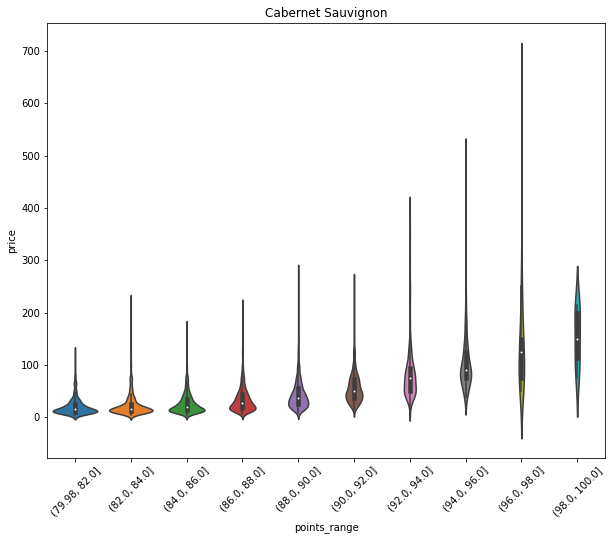

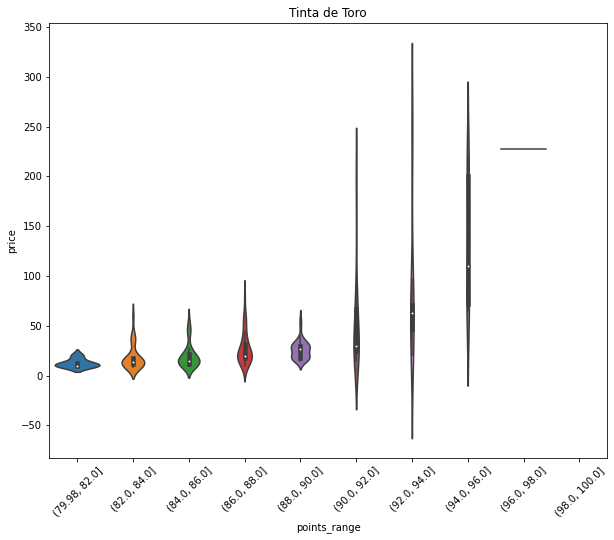

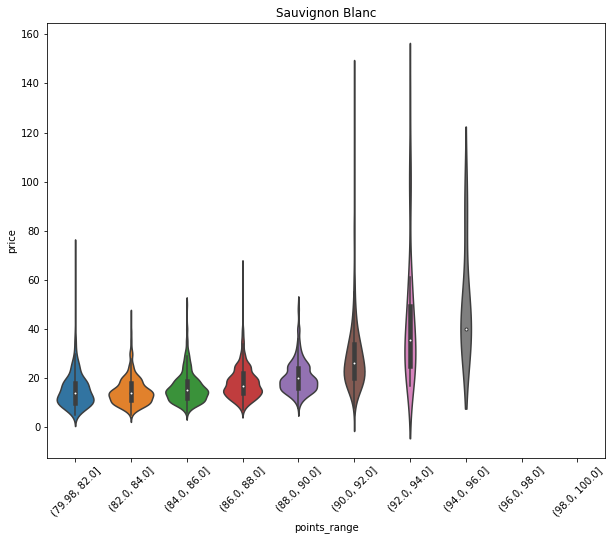

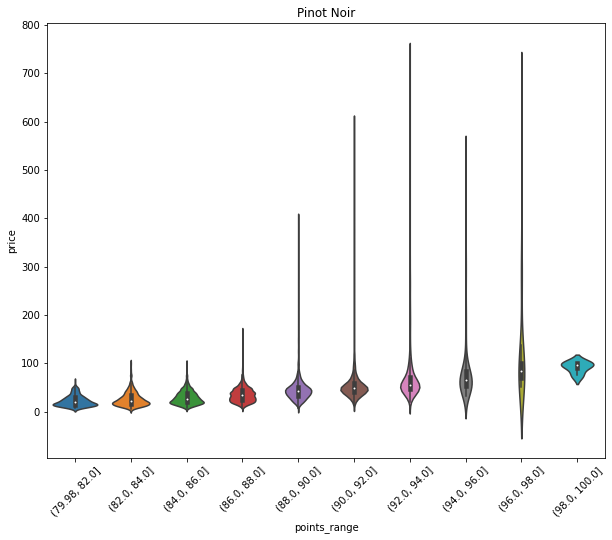

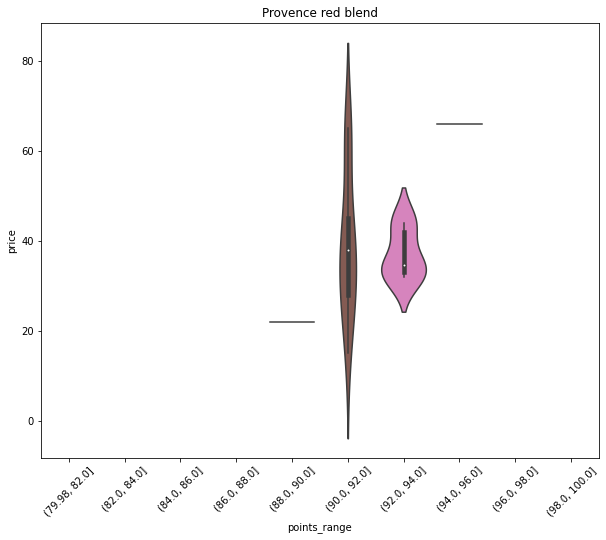

...

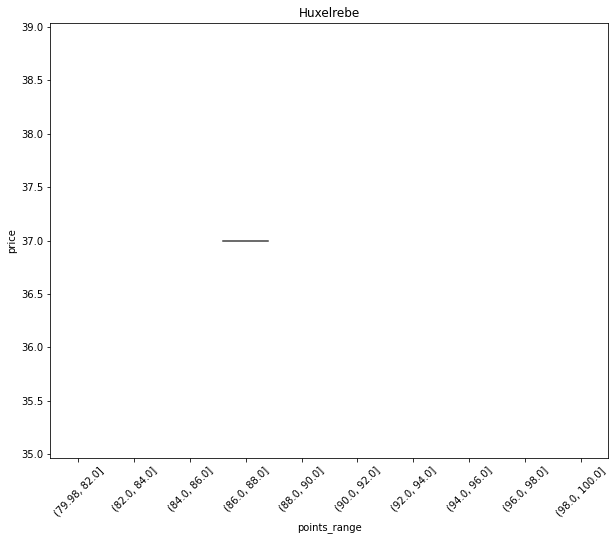

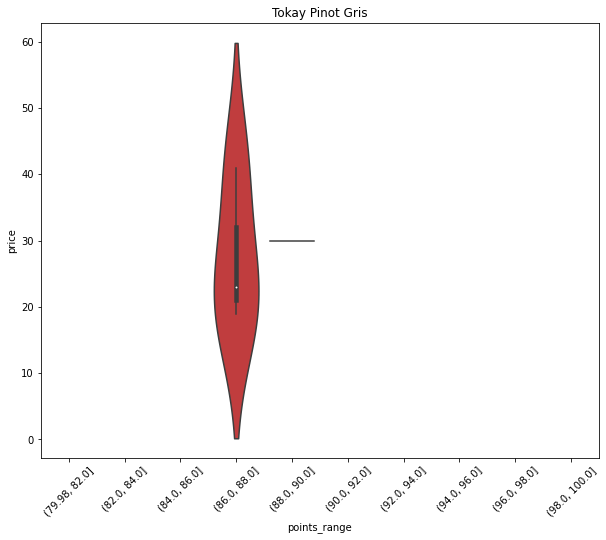

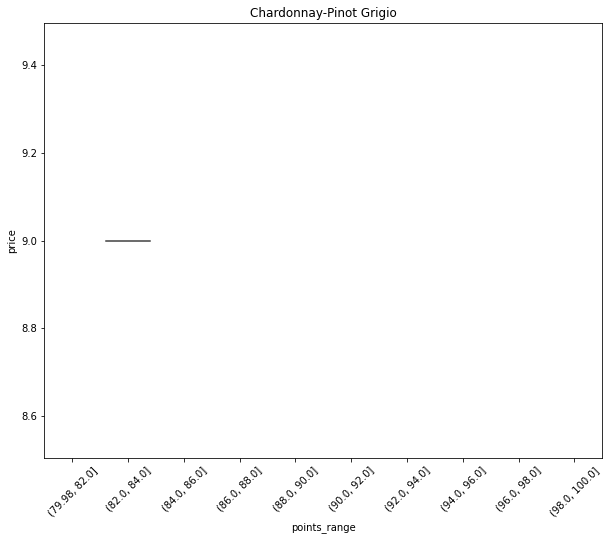

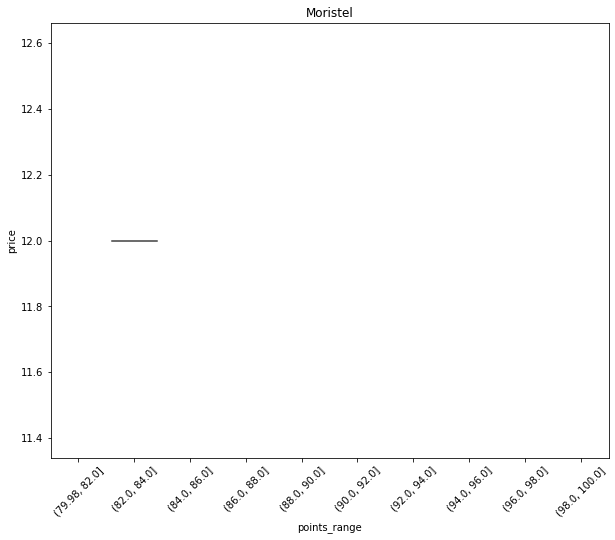

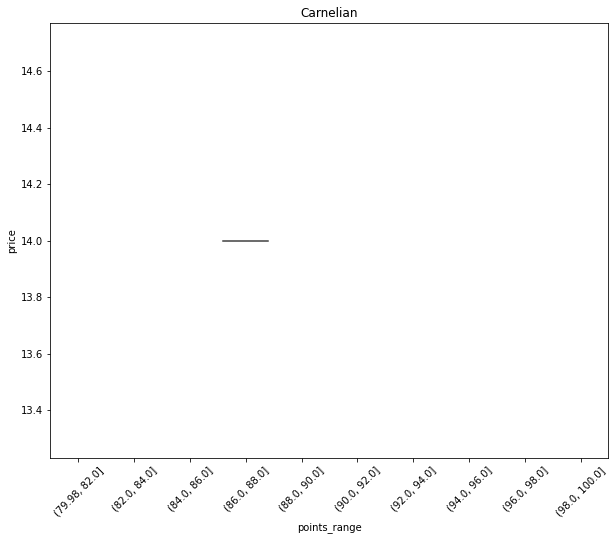

In [ ]:
#violin
points = wine_table['points'].to_list()
wine_table['points_range'] = pd.cut(points, 10)

varieties = wine_table['variety']
varieties = list(dict.fromkeys(varieties))
 
#Create graphs for each variety and their target price for points
for var in varieties:
  qry = wine_table[wine_table['variety'] == var]
  plt.figure(figsize=(10, 8))
  sns.violinplot(x=qry['points_range'], y=qry['price'], data=qry).set_title(var)
  plt.xticks(rotation=45)
  plt.show()

# Finding Best Wine at Different Price Points
This code cells represents how our analysis of the wine tasting data can help people find the best quality wine for their price range.  An example of 15 dollars falls under the category of 0 to 20 dollars depending on local tax legislature.  After searching through the database, our program is able to return a row representing a Syrah wine in Washington, USA that received a score of 96 points for just 20 dollars spent.  This is an example of filtering that we are able to do in order to provide wine drinkers with tools helping them to explore new bottles that they may have been seeking all along.  Plenty more filters can be added in order to even further personalize and narrow the search results down, however implementation of this may have seemed redundant.  Our code shows what we are capable of and how a shopper may use this tool.


In [44]:
#Find the best wine for $15
target = 15.0
range = ''
if 0.0 <= target < 20.0:
  range = '0-20'
elif 20.0 <= target < 50.0:
  range = '20-50'
elif 50.0 <= target < 100.0:
  range = '50-100'
elif 100.0 <= target < 200.0:
  range = '100-200'
elif 200.0 <= target < 500.0:
  range = '200-500'
else:
  range = '>500'

points = 0

qry = wine_table[wine_table['custom_price_range'] == range]
for index, row in qry.iterrows():
  if row['points'] > points:
    points = row['points']
    best_value = row

print(best_value)

Unnamed: 0                                                        56971
country                                                              US
description           Superb fruit highlights this tight, sculpted S...
designation                                                         NaN
points                                                               96
price                                                                20
province                                                     Washington
region_1                                           Columbia Valley (WA)
region_2                                                Columbia Valley
variety                                                           Syrah
winery                                                             Rulo
custom_price_range                                                 0-20
Name: 56971, dtype: object


The last section of code added for our projects reflects changes made to the dataset in order to better optimize and fit our data for our needs.  Columns added with ranges to provide a more personalized experience for the user was our goal in helping people find great wine that is of their type and budget.


In [ ]:
#Show our updated data table with added columns
wine_table.head()

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery,price_range,points_range,custom_price_range
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz,"(157.067, 310.133]","(94.0, 96.0]",>500
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez,"(1.704, 157.067]","(94.0, 96.0]",100-200
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley,"(1.704, 157.067]","(94.0, 96.0]",50-100
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi,"(1.704, 157.067]","(94.0, 96.0]",50-100
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude,"(1.704, 157.067]","(94.0, 96.0]",50-100


# Conclusion

From this tutorial we can make wine shopping more efficient, allowing you to get the best tasting wine for your budget. 
We beleive we have achieved our goal in optimizing wine shopping as we cater to all wine consumers both novices and experts alike.

These tools are not limited to wine. Retailers can use these tools to enhance customer experiences as well increase their chances for sales. Customers also benefit as their own tastes are taken into consideration, and can be rest-assured that they are not overspending, it also narrows down the search, allowing customers to find what they want quicker.